# 0. Import Libraries

In [ ]:
import numpy as np
import re
import matplotlib.pyplot as plt
from PIL import Image
import os
import torch
from torch.utils.data import DataLoader
import json
import math
from PIL import Image
import cv2
import plotly.graph_objects as go
from matplotlib import pyplot as plt
import time
import imageio
from tqdm import trange
from base64 import b64encode
from IPython.display import HTML
from tqdm import trange
import numpy as np
import torch
from tqdm import tqdm
import imageio
! pip install rembg
from rembg import remove
import torch
import torch.nn as nn

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## DO NOT PUSH

In [ ]:
# Also, seed everything for reproducibility
# code from https://gist.github.com/ihoromi4/b681a9088f348942b01711f251e5f964#file-seed_everything-py
def seed_everything(seed: int):
    import os
    import random

    import numpy as np
    import torch
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True


seed_everything(0)

# 1. Data Processing

## 1.1 Loading Data

### 1.1.1 Load Data From Folders

In [ ]:
# lego_train_folder = '/content/drive/MyDrive/APS360/lego/train'
# lego_val_folder = '/content/drive/MyDrive/APS360/lego/val'
# lego_test_folder = '/content/drive/MyDrive/APS360/lego/test'


lego_train_folder = '/content/drive/MyDrive/APS360/nestea_dataset/train'
lego_val_folder = '/content/drive/MyDrive/APS360/nestea_dataset/val'
lego_test_folder = '/content/drive/MyDrive/APS360/nestea_dataset/test'


# lego_pos_train_folder = '/content/drive/MyDrive/APS360/lego/transforms_train.json'
# lego_pos_val_folder = '/content/drive/MyDrive/APS360/lego/transforms_val.json'
# lego_pos_test_folder = '/content/drive/MyDrive/APS360/lego/transforms_test.json'


lego_pos_train_folder = '/content/drive/MyDrive/APS360/nestea_dataset/transforms_train.json'
lego_pos_val_folder = '/content/drive/MyDrive/APS360/nestea_dataset/transforms_val.json'
lego_pos_test_folder = '/content/drive/MyDrive/APS360/nestea_dataset/transforms_test.json'

### 1.1.2 Load Images

In [ ]:
def load_images_from_folder(folder):
    """
    Loads images from a folder and sorts them by file name.

    Args:
        folder (str): The path to the folder containing images.

    Returns:
        np.ndarray: Array of images with shape (num_images, height, width, channels).
    """
    images = []
    # Get all file names from the folder and sort them
    file_names = sorted(os.listdir(folder))

    for filename in file_names:
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(folder, filename)
            try:
                img = Image.open(img_path)
                img = img.convert('RGB')  # Ensure 3 channels
                images.append(np.array(img))
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")

    return np.array(images)

# Load images
train_images = load_images_from_folder(lego_train_folder)
if train_images.size == 0:
    raise ValueError("No images found in the train folder.")

val_images = load_images_from_folder(lego_val_folder)
if val_images.size == 0:
    raise ValueError("No images found in the val folder.")

test_images = load_images_from_folder(lego_test_folder)
if test_images.size == 0:
    raise ValueError("No images found in the test folder.")

In [ ]:
train_images.shape

(193, 852, 480, 3)

### 1.1.3 Load COLMAP Data

In [ ]:
def sort_json_by_file_number(json_data):
    """
    Sorts the frames in the JSON data by file numbers extracted from file_path.

    Args:
        json_data (dict): The JSON data to sort.

    Returns:
        dict: The sorted JSON data.
    """
    frames = json_data['frames']

    # Function to extract file number from file_path
    def extract_file_number(file_path):
        match = re.search(r'(\d+)\.jpg$', file_path)
        return int(match.group(1)) if match else float('inf')

    # Sort frames based on the extracted file number
    sorted_frames = sorted(frames, key=lambda x: extract_file_number(x['file_path']))

    # Return the updated JSON data with sorted frames
    return {
        'camera_angle_x': json_data['camera_angle_x'],
        'frames': sorted_frames
    }

In [ ]:
# Open file with camera data - in read mode
with open(lego_pos_train_folder, 'r') as f:
    data = json.load(f)

# Sort the JSON data by file numbers
sorted_data = sort_json_by_file_number(data)

# Extract the transform matrix for each frame from sorted data
img_poses = []  # img_poses represents the camera to world matrix
for frame in sorted_data['frames']:
    transform_matrix = np.array(frame['transform_matrix'], dtype=np.float32)
    img_poses.append(transform_matrix)

# Stack all the matrices into a single tensor
train_poses = np.stack(img_poses)

In [ ]:
# Open file with camera data - in read mode
with open(lego_pos_val_folder, 'r') as f:
    data = json.load(f)

# Sort the JSON data by file numbers
sorted_data = sort_json_by_file_number(data)

# Extract the transform matrix for each frame from sorted data
img_poses = []  # img_poses represents the camera to world matrix
for frame in sorted_data['frames']:
    transform_matrix = np.array(frame['transform_matrix'], dtype=np.float32)
    img_poses.append(transform_matrix)


# Stack all the matrices into a single tensor
val_poses = np.stack(img_poses)

In [ ]:
# Open file with camera data - in read mode
with open(lego_pos_test_folder, 'r') as f:
    data = json.load(f)

# Sort the JSON data by file numbers
sorted_data = sort_json_by_file_number(data)

# Extract the transform matrix for each frame from sorted data
img_poses = []  # img_poses represents the camera to world matrix
for frame in sorted_data['frames']:
    transform_matrix = np.array(frame['transform_matrix'], dtype=np.float32)
    img_poses.append(transform_matrix)

# Stack all the matrices into a single tensor
test_poses = np.stack(img_poses)

## 1.2 Image Preprocessing

### 1.2.1 Resizing and Camera Parameters

In [ ]:
def resize_image(images, target_shorter_dim):
    """
    Resize images so that the shortest dimension is set to target_shorter_dim while maintaining aspect ratio.

    Args:
        images (numpy.ndarray): Array of images with shape (N, H, W, C).
        target_shorter_dim (int): The target size for the shortest dimension.

    Returns:
        numpy.ndarray: Array of resized images.
    """
    resized_images = []
    for img in images:
        img_pil = Image.fromarray(img)
        width, height = img_pil.size

        # Determine new dimensions
        if width < height:
            new_width = target_shorter_dim
            new_height = int((target_shorter_dim / width) * height)
        else:
            new_width = int((target_shorter_dim / height) * width)
            new_height = target_shorter_dim

        img_resized = img_pil.resize((new_width, new_height), Image.LANCZOS)
        resized_images.append(np.array(img_resized))

    return np.array(resized_images)

In [ ]:
def plot_images(images, num_cols, title=None):
    num_images = images.shape[0]
    if num_images > 0:
        num_rows = (num_images + num_cols - 1) // num_cols  # Ceiling division
        fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))

        # Flatten axs array if it has only one row or one column
        if num_rows == 1:
            axs = axs.reshape(1, -1)
        elif num_cols == 1:
            axs = axs.reshape(-1, 1)

        for i in range(num_rows * num_cols):
            row, col = divmod(i, num_cols)
            if i < num_images:
                axs[row, col].imshow(images[i])
                axs[row, col].axis('off')
            else:
                axs[row, col].axis('off')

        # Add title if provided
        if title:
            fig.suptitle(title, fontsize=16)

        plt.tight_layout()
        plt.show()
    else:
        print("No images to display.")

In [ ]:
# Resize images
train_images = resize_image(train_images, 100)
val_images = resize_image(val_images, 100)
test_images = resize_image(test_images, 100)

# Select smaller sample of data
'''
if train_images.shape[0] > 80:
  train_images = train_images[:80]
if train_poses.shape[0] > 80:
  train_poses = train_poses[:80]
'''

random_indices = np.random.choice(val_images.shape[0], 6, replace=False)
if val_images.shape[0] > 6:
  val_images = val_images[random_indices]
if val_poses.shape[0] > 6:
  val_poses = val_poses[random_indices]

In [ ]:
H, W = train_images.shape[1:3]

with open(lego_pos_train_folder, 'r') as f:
    data = json.load(f)

# Given camera_angle_x (in radians) and image width W (in pixels)
camera_angle_x = data['camera_angle_x']

# Calculate the focal length
focal = W / (2 * math.tan(camera_angle_x / 2))

print(focal)

161.7500208158766


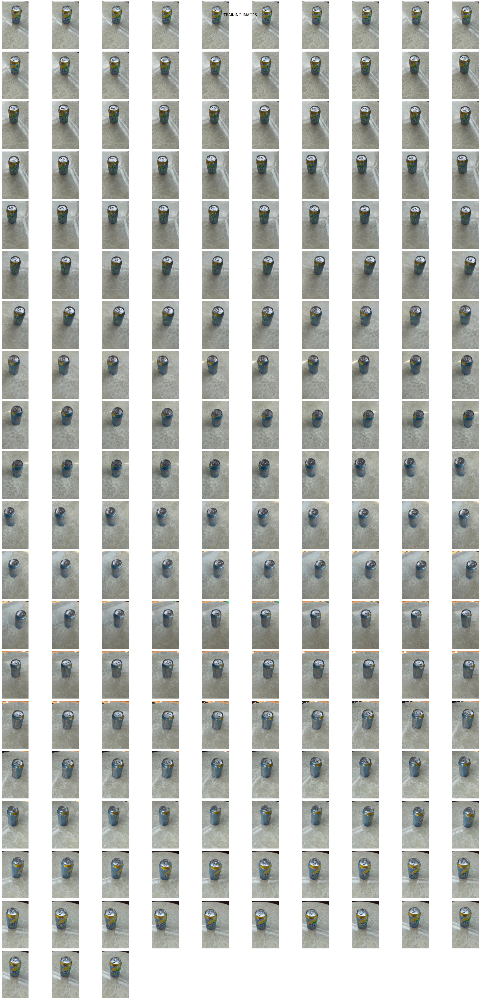

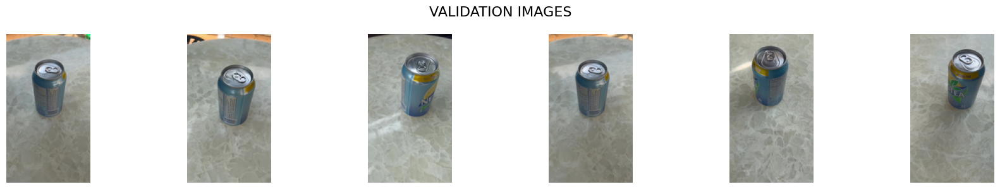

In [ ]:
plot_images(train_images, 10, "TRAINING IMAGES")
plot_images(val_images, 6, "VALIDATION IMAGES")

### 1.2.2 Removing Backgrounds

In [ ]:
def remove_background_and_keep_alpha(image):
    """
    Removes the background from an image but keeps the alpha channel.

    Args:
        image (numpy.ndarray): Image with shape (H, W, C) where C can be 3 or 4.

    Returns:
        numpy.ndarray: Image with alpha channel where background is removed.
    """
    if image.shape[2] == 3:
        # Add alpha channel
        image = np.dstack((image, np.ones((image.shape[0], image.shape[1]), dtype=np.uint8) * 255))

    img_pil = Image.fromarray(image)
    img_no_bg = remove(img_pil)

    # Convert to numpy array and back to RGB
    img_no_bg_rgb = Image.fromarray(np.array(img_no_bg)).convert('RGB')

    # Convert to numpy array
    return np.array(img_no_bg_rgb)

In [ ]:
def center_image(image, target_size):
    """
    Centers the item in the image and resizes it to target_size.

    Args:
        image (numpy.ndarray): Image with shape (H, W, 4).
        target_size (tuple): Target size (width, height).

    Returns:
        numpy.ndarray: Centered and resized image without alpha channel.
    """
    img_pil = Image.fromarray(image)
    img_pil = img_pil.convert('RGBA')  # Ensure image is in RGBA mode

    # Calculate the scaling factor to fit the image within the target size
    img_width, img_height = img_pil.size
    aspect_ratio = min(target_size[0] / img_width, target_size[1] / img_height)
    new_width = int(img_width * aspect_ratio)
    new_height = int(img_height * aspect_ratio)
    img_resized = img_pil.resize((new_width, new_height), Image.ANTIALIAS)

    # Create a white background
    background = Image.new('RGBA', target_size, (255, 255, 255, 255))
    bg_width, bg_height = target_size

    # Calculate position to paste the image onto the center of the background
    left = (bg_width - new_width) // 2
    top = (bg_height - new_height) // 2

    # Paste the image onto the background
    background.paste(img_resized, (left, top), img_resized)
    centered_image = np.array(background)

    # Convert back to RGB (removing alpha channel)
    centered_image_rgb = Image.fromarray(centered_image).convert('RGB')

    return np.array(centered_image_rgb)

In [ ]:
def process_images(images, target_size):
    """
    Process images: Resize, remove background, center, and resize to target_size.

    Args:
        images (numpy.ndarray): Array of images with shape (N, H, W, C).
        target_size (tuple): Final target size (width, height).

    Returns:
        numpy.ndarray: Array of processed images.
    """
    # Step 2: Remove backgrounds and keep alpha channel
    images_with_alpha = [remove_background_and_keep_alpha(img) for img in images]

    # Step 3 & 4: Center image and resize to 100x100
    # final_images = [center_image(img, target_size) for img in images_with_alpha]

    return np.array(images_with_alpha)

In [ ]:
# Process images (resize, remove background, center, and resize to 100x100)
train_images = process_images(train_images, (100, 100))
val_images = process_images(val_images, (100, 100))
test_images = process_images(test_images, (100, 100))

100%|███████████████████████████████████████| 176M/176M [00:00<00:00, 28.5GB/s]


In [ ]:
# Normalize images
train_images = train_images / 255.0
val_images = val_images / 255.0
test_images = test_images / 255.0

val_images.shape

(6, 177, 100, 3)

## 1.3 Verify Data

In [ ]:
print('focal:', focal)
print(train_images.shape, val_images.shape, train_images.shape)
print(train_poses.shape, val_poses.shape, test_poses.shape)

print('\nValidation Images min:', val_images.min(), 'max:', val_images.max())
print('Validation Poses min:', val_poses.min(), 'max:', val_poses.max())
print('Train Images min:', train_images.min(), 'max:', train_images.max())
print('Train Poses min:', train_poses.min(), 'max:', train_poses.max())


focal: 161.7500208158766
(193, 177, 100, 3) (6, 177, 100, 3) (193, 177, 100, 3)
(193, 4, 4) (6, 4, 4) (42, 4, 4)

Validation Images min: 0.0 max: 0.996078431372549
Validation Poses min: -1.6576012 max: 3.8959448
Train Images min: 0.0 max: 1.0
Train Poses min: -1.8423983 max: 3.8980665


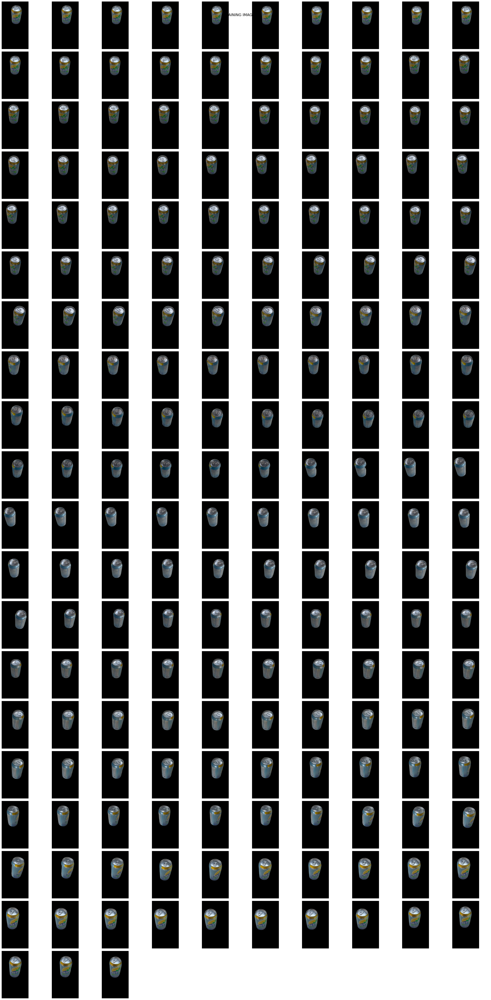

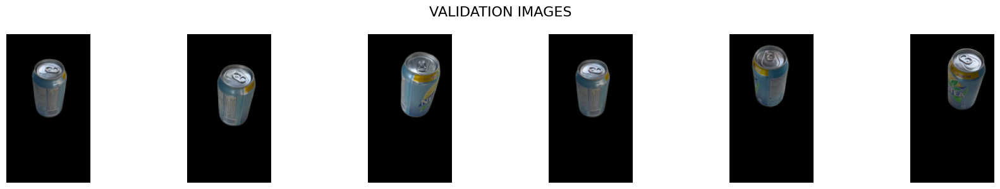

In [ ]:
plot_images(train_images, 10, "TRAINING IMAGES")

plot_images(val_images, 6, "VALIDATION IMAGES")

## 1.4 Ray Casting

In [ ]:
# CITE https://github.com/yenchenlin/nerf-pytorch/blob/master/run_nerf_helpers.py#L153

def get_rays(H, W, focal, c2w):
    i, j = np.meshgrid(np.arange(W), np.arange(H), indexing='xy')

    # transform the image coordinates to world coordinate system
    dirs = np.stack([(i-W*.5)/focal, -(j-H*.5)/focal, -np.ones_like(i)], -1)
    rays_d = np.sum(dirs[..., np.newaxis, :] * c2w[:3,:3], -1)
    rays_o = np.broadcast_to(c2w[:3,-1], rays_d.shape)
    return np.stack([rays_o, rays_d], 0)

In [ ]:
# CITE https://github.com/yenchenlin/nerf-pytorch/blob/master/run_nerf_helpers.py#L153
def get_training_data(H, W, focal, poses, images):
    training_data = None
    all_rays = []  # This will store the rays' origins and directions
    all_rgbs = []  # This will store the corresponding RGB values

    for pose in poses:
        # Generate rays for each pose
        rays = get_rays(H, W, focal, pose)
        all_rays.append(rays)

    # Convert the list of rays and RGB values into numpy arrays
    all_rays_np = np.stack(all_rays, axis=1)  # Shape: (2, num_images, H, W, 3)
    all_rgbs_np = images.reshape(1, images.shape[0], H, W, 3)  # Add an extra dimension to match rays shape

    # Concatenate rays and RGB values along the first dimension
    training_data = np.concatenate((all_rays_np, all_rgbs_np), axis=0)  # Shape: (3, num_images, H, W, 3)
    return training_data


In [ ]:
N, H, W, C = train_images.shape


In [ ]:
training_data = get_training_data(H, W, focal, train_poses, train_images)

# Move batch dimension to the start
training_data = np.moveaxis(training_data, 0, -2)
# Reshape the training data to have shape [-1, 3, 3] and shuffle the data
training_data = np.array(np.reshape(training_data, [-1, 3, 3]))
seed_everything(0)
np.random.shuffle(training_data)

# Convert the training data to a NumPy array
training_data = np.asarray(training_data, dtype=np.float32)

# 2. Positional Encoding

In [ ]:
import torch

def positional_encoding(p, L):
    """
    Applies positional encoding to input coordinates by utilizing sine and cosine functions across multiple frequency bands.

    Arguments:
        p (torch.Tensor): Tensor containing coordinates of shape (..., d)
        L (int): Specifies the number of frequency bands.

    Output:
        torch.Tensor: A tensor with shape (..., d + 2 * d * L), incorporating the original coordinates and their encoded values at various frequencies.
    """

    # Generate exponents 0, 1, 2, ..., L - 1
    exponents = torch.linspace(0, L - 1, L).float()

    # Compute 2 raised to the power of each element
    freq = torch.pow(2, exponents).to(p.device)

    # Expand dimensions of p and L to prepare for multiplication with frequency bands
    p_expanded = p.unsqueeze(-1)  # Shape: [..., d, 1]
    freq_expanded = freq.view(*(1,) * (p.dim() - 1), L)  # Shape: [1, 1, ..., L]

    # Multiply input by frequencies, scaling by pi for both sin and cos
    x = p_expanded * freq_expanded * torch.pi

    # Compute sin and cos
    f_sin = torch.sin(x)
    f_cos = torch.cos(x)

    # Merge sin and cos tensors along the frequency axis
    output = torch.cat((f_sin, f_cos), dim=-1)  # Shape: [..., d, 2 * L]

    # Flatten the frequency and dimension axes into a single axis
    output = output.view(*p.shape[:-1], -1)  # Shape: [..., d * 2 * L]

    # Append the encoded values to the original coordinates
    output = torch.cat((p, output), dim=-1)  # Shape: [..., d + d * 2 * L]

    return output


# 3. Model

In [ ]:
# https://github.com/MaximeVandegar/Papers-in-100-Lines-of-Code/blob/main/NeRF_Representing_Scenes_as_Neural_Radiance_Fields_for_View_Synthesis/nerf.py

class SimpleNeRFMLP(nn.Module):
    def __init__(self, in_dim, net_dim, num_layers):
        super(SimpleNeRFMLP, self).__init__()


        self.block1 = nn.Sequential(
            nn.Linear(in_dim, net_dim),
            nn.ReLU(True),
            nn.Linear(net_dim, net_dim),
            nn.ReLU(True)
        )


        self.hidden_blocks = nn.ModuleList()
        for _ in range((num_layers - 4) // 2):
            self.hidden_blocks.append(nn.Sequential(
                nn.Linear(net_dim, net_dim),
                nn.ReLU(True),
                nn.Linear(net_dim, net_dim),
                nn.ReLU(True)
            ))


        self.block_final = nn.Linear(net_dim, 4)

    def forward(self, x):
        # Pass through the first block
        x = self.block1(x)

        for block in self.hidden_blocks:
            x = block(x)
        out = self.block_final(x)

        return out

# 4. Training

## 4.1 Rendering Rays

In [ ]:
def render_rays(
    model, num_freq_bands, rays, near, far, N_samples, rand=False):
    # super long comments...
    """
    Renders an image from 3D rays by first uniformly sampling points along each
    ray, encoding these points using positional encoding, and then computing the
    predicted color and opacity at each point using the given MLP model.

    Args:
    model (nn.Module): MLP model that takes encoded 3D points as input and
            returns the predicted color and opacity.
    num_freq_bands (int): Number of frequency bands used for positional encoding.
    rays (Tuple[torch.Tensor, torch.Tensor]): Tuple containing origin and
        direction of the rays. Both tensors are of shape (num_rays, 3).
    near (float): Near clipping plane distance.
    far (float): Far clipping plane distance.
    N_samples (int): Number of samples along each ray.
    rand (bool): Boolean indicating whether to add random noise to jitter training points.

    Returns:
    Tuple[torch.Tensor, torch.Tensor, torch.Tensor]: A tuple containing:
    - rgb_map (torch.Tensor): Tensor of shape (num_rays, 3)
          containing the predicted RGB color for each pixel in the image.
    - depth_map (torch.Tensor): Tensor of shape (num_rays, )
          containing the predicted depth for each pixel in the image.
    - acc_map (torch.Tensor): Tensor of shape (num_rays,)
          containing the accumulated alpha (transmittance) for each pixel in the image.
    """
    #Cite Github: https://github.com/royorel/StyleSDF/blob/main/volume_renderer.py
    rays_o, rays_d = rays
    # uniformly sample points in the space from near to far.
    interpolations = torch.linspace(
        near, far, N_samples, device=rays_o.device).repeat(rays_o.shape[0], 1)
    if rand:
        # add random noise to jitter training points
        interpolations += (torch.rand(
            list(rays_o.shape[:-1]) + [N_samples], device=rays_o.device)
                  * (far-near)/N_samples) # we need to scale the noise accordingly

    # sampled pts in 3D space
    pts = rays_o[...,None,:] + rays_d[...,None,:] * interpolations[...,:,None]
    pts_flat = torch.reshape(pts, [-1,3])

    # Apply positional encoding to pts_flat
    pts_flat_freq_encoded = positional_encoding(pts_flat, num_freq_bands).float()
    raw = model(pts_flat_freq_encoded)
    raw = torch.reshape(raw, list(pts.shape[:-1]) + [4])

    # Compute opacities/occupancy and colors
    rgb, sigma_a = raw[...,:3], raw[...,3]
    sigma_a = torch.nn.functional.relu(sigma_a)
    rgb = torch.sigmoid(rgb)

    #Cite Medium Article: https://medium.com/@ibrahim.farhat.co/understanding-nerf-on-a-small-scale-26a826b113ab
    # Do volume rendering
    # delta
    dists = torch.cat([interpolations[..., 1:] - interpolations[..., :-1],
                       torch.full_like(interpolations[...,:1], 1e10, device=rays_o.device)], -1)
    # alpha
    alpha = 1.-torch.exp(-sigma_a * dists)
    # transmittance
    trans = torch.where(1 - alpha > 1., 1., 1.-alpha + 1e-10)
    trans = torch.cat([torch.ones_like(trans[...,:1]), trans[...,:-1]], -1)
    # weights
    weights = alpha * torch.cumprod(trans, -1)

    rgb_map = torch.sum(weights[...,None] * rgb, -2)
    acc_map = torch.sum(weights, -1)
    depth_map = torch.sum(weights * interpolations, -1)
    return rgb_map, depth_map, acc_map

## 4.2 Training Code

In [ ]:
def train_nerf_model(
  model, optimizer, criterion, iters, train_data, images, H, W, focal, poses, device,
  num_freq_bands=8, batch_size=1024, near=2., far=6., N_samples=64):
  '''
  Trains a Neural Radiance Fields (NeRF) model on a given dataset.
  The function uses batching/chunks to handle large amounts of data that cannot fit into GPU memory all at once.
  The function also uses MSE and PSNR (as used in Chang et Al's NerF Paper) to evaluate the accuracy of the training.

  Here's a detailed explanation of the relevant code snippet:

  Arguments:
    model (torch.nn.Module): Neural network model to be trained.
    optimizer (torch.optim.Optimizer): Optimization algorithm for updating the model's parameters.
    criterion (torch.nn.Module): Loss function to compute the error between predictions and ground truth.
    iters (int): Number of training iterations.
    train_data (torch.Tensor): Training dataset containing rays and corresponding target values.
    device (torch.device): Device (CPU or GPU) to perform computations on.
    num_freq_bands (int, optional): Number of frequency bands used for positional encoding (default: 8).
    batch_size (int, optional): Number of rays to process in each training batch (default: 1024).
    near (float): Near bound of the scene for ray sampling (default: 2.0).
    far (float): Far bound of the scene for ray sampling (default: 6.0).
    N_samples (int): Number of samples

  Returns:
    tuple: Tensors containing the RGB values, depth, and accumulated transmittance after processing.
  '''

  seed_everything(0)

  batch_ind = 0 #batch index
  psnrs, mses, num_iter = [], [], []
  t = time.time()
  num_chunks = 5

  def batchify(rays, num_chunks):
    ray_chunks = torch.chunk(rays, num_chunks, dim=1)
    for k in range(num_chunks):
      #model, num_freq_bands, rays, near, far, N_samples, rand=False):
      rgb_chunk, depth_chunk, acc_chunk = render_rays(model, num_freq_bands, ray_chunks[k].to(device), near, far, N_samples, rand=False)
      # Merge the results from each chunk back together
      if k != 0:
        rgb, depth, acc = torch.cat((rgb, rgb_chunk), dim=0), torch.cat((depth, depth_chunk), dim=0), torch.cat((acc, acc_chunk), dim=0)
      else:
        rgb, depth, acc = rgb_chunk, depth_chunk, acc_chunk
    return rgb, depth, acc

  def define_rays():
    # Render the holdout view for logging
    # use global variables here
    rays = torch.tensor(get_rays(H, W, focal, poses[v,...])).reshape(2, -1, 3)

    # Use the batchified function
    image_h = train_images.shape[1]
    image_w = train_images.shape[2]
    rgb, depth, acc =batchify(rays,num_chunks=5)
    rgb, depth, acc = rgb.reshape(image_h, image_w, 3), depth.reshape(image_h, image_w, 1), acc.reshape(image_h, image_w, 1)
    return rgb, depth, acc

  for i in range(iters):
    # iterate data
    batch = training_data[batch_ind: batch_ind + batch_size]
    batch_ind += batch_size
    rays = torch.moveaxis(torch.tensor(batch[:, :2]).to(device), 1, 0)
    target = torch.tensor(batch[:, 2]).to(device)
    if batch_ind > training_data.shape[0]:
      batch_ind = 0

    # Reset the gradients of the optimizer
    optimizer.zero_grad()
    # Forward pass through the model to obtain predictions
    rgb_map, depth_map, acc_map = render_rays(model, num_freq_bands, rays, near, far, N_samples, rand=True)
    # Compute the loss between the predictions and the training data
    loss = criterion(rgb_map, target)

    # Backward pass through the model to compute gradients
    loss.backward()

    # Update the model parameters using the optimizer
    optimizer.step()

    # Every 1000 iterations, compute and store the training and testing PSNRs,
    if i % 1000 == 0 or i == iters:
      model.eval()
      with torch.no_grad():
        psnr = []
        mse_list=[]
        # use global training poses here
        num_vals = poses.shape[0] if i == iters else 1
        for v in range(num_vals):
          rgb, depth, acc = define_rays()

          loss = criterion(rgb, torch.tensor(images[v,...], device=device))

          psnr.append(-10. * torch.log10(loss))

          mse_loss=criterion(rgb, torch.tensor(images[v, ...], device=device))
          mse_list.append(mse_loss.item())

          print(i, (time.time() - t), 'secs per 1000 iters', 'psnr:', psnr[-1])
          t = time.time()

          psnr = torch.mean(torch.tensor(psnr))
          psnrs.append(psnr)

          mse = torch.mean(torch.tensor(mse_list))
          mses.append(mse)

          num_iter.append(i)
          print(f"mse:{mse}, psnrs:{psnr}")

        model.train()

      #plot results
      plt.figure(figsize=(10,4))
      plt.subplot(121)
      plt.imshow(rgb.cpu().numpy())
      #tensor rgb is in gpu, plt.imshow expects a numpy array, which resides in cpu main memory
      plt.title(f'Iteration: {i}')
      plt.subplot(122)
      plt.plot(num_iter, psnrs)
      plt.title('PSNR')
      plt.show()

      plt.title(f'Iteration: {i}')
      plt.subplot(122)
      plt.plot(num_iter, mses)
      plt.title('MSE')
      plt.show()

  # Return the training and testing results as a dictionary
  return {
    'psnrs': psnrs,
    'mses': mses,
    'num_iter': num_iter,
  }

## 4.3 Run Tests

0 1.3646559715270996 secs per 1000 iters psnr: tensor(8.7724, device='cuda:0', dtype=torch.float64)
mse:0.13266554474830627, psnrs:8.772418682359861


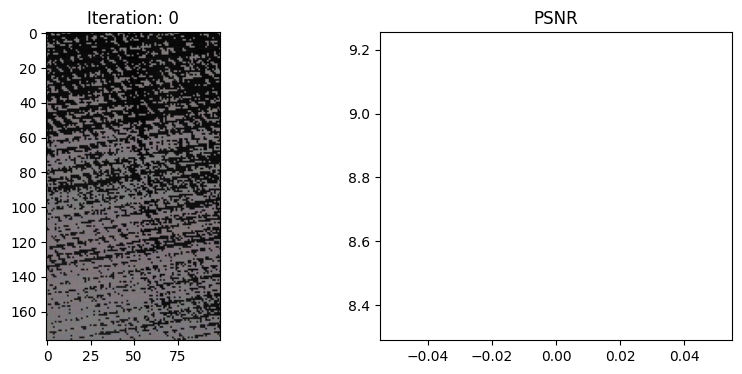

<ipython-input-65-17a5f0f87eb4>:125: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(122)


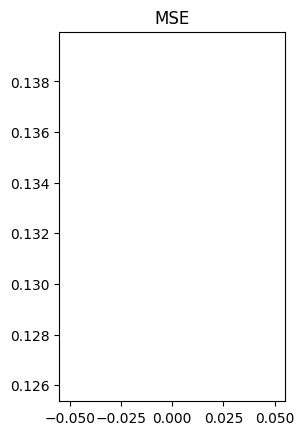

1000 13.068407773971558 secs per 1000 iters psnr: tensor(24.7840, device='cuda:0', dtype=torch.float64)
mse:0.0033235710579901934, psnrs:24.783950454197914


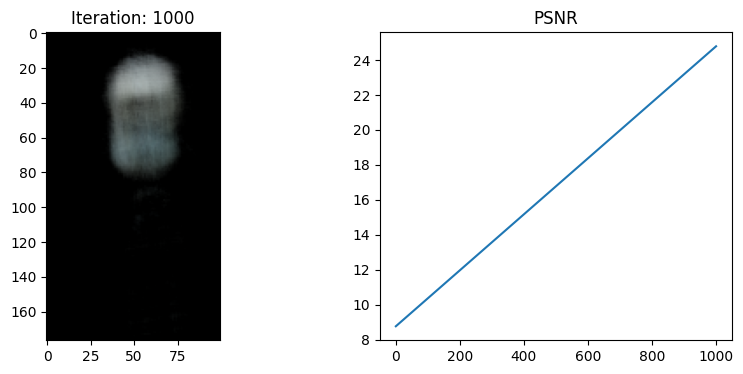

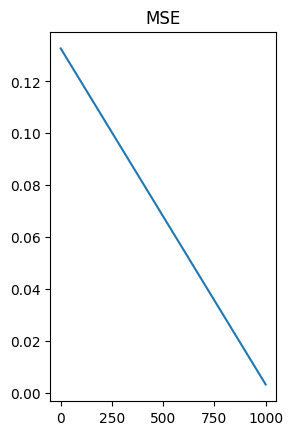

2000 13.590789794921875 secs per 1000 iters psnr: tensor(25.4504, device='cuda:0', dtype=torch.float64)
mse:0.0028507737442851067, psnrs:25.450372333666273


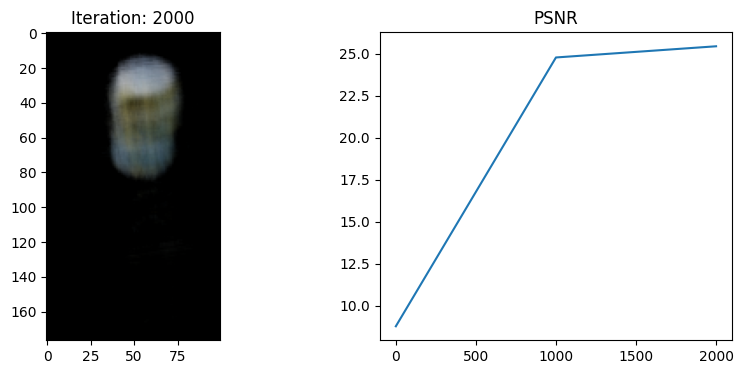

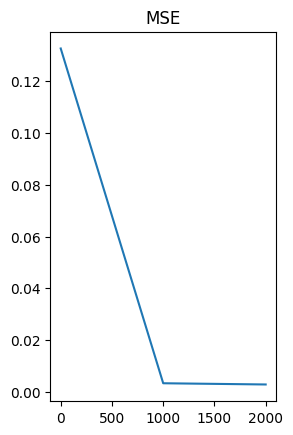

3000 15.020958423614502 secs per 1000 iters psnr: tensor(25.9604, device='cuda:0', dtype=torch.float64)
mse:0.0025349226780235767, psnrs:25.960352740247398


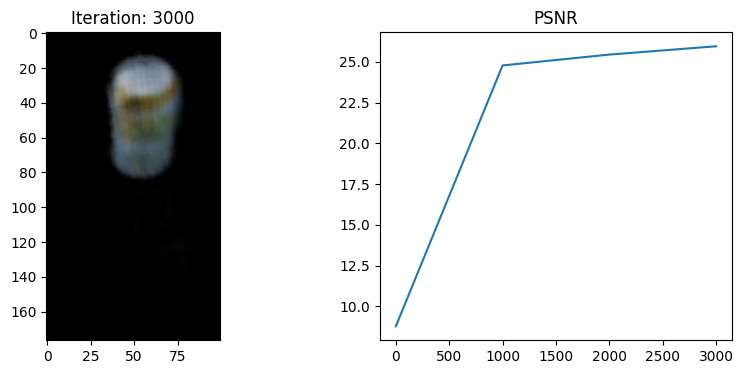

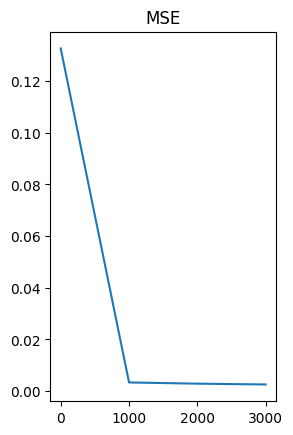

4000 13.52513861656189 secs per 1000 iters psnr: tensor(25.8864, device='cuda:0', dtype=torch.float64)
mse:0.002578479703515768, psnrs:25.88636302333674


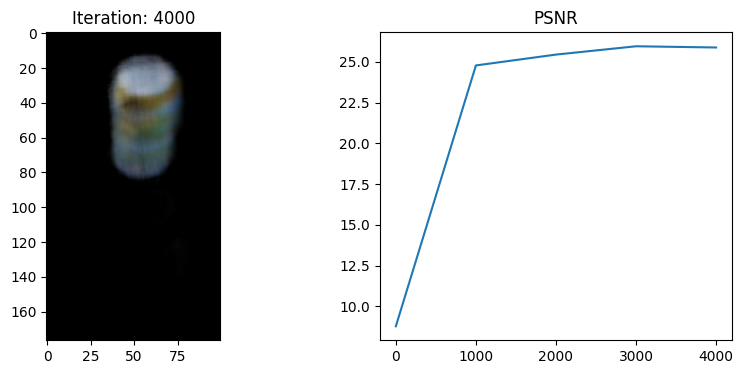

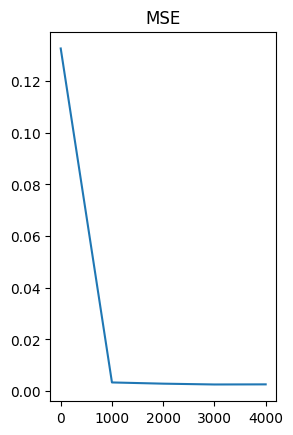

5000 13.160741329193115 secs per 1000 iters psnr: tensor(26.4899, device='cuda:0', dtype=torch.float64)
mse:0.0022439388558268547, psnrs:26.489889845715542


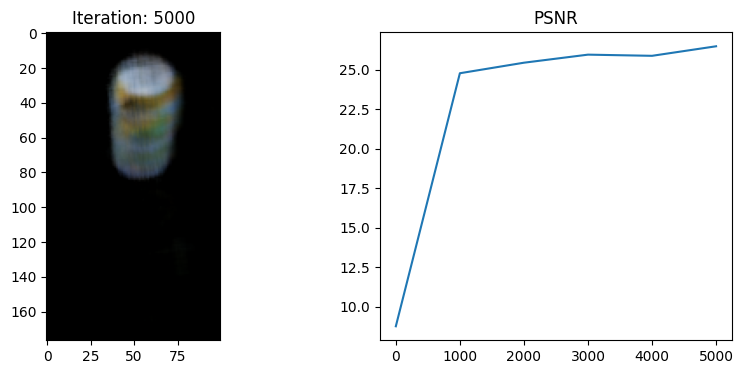

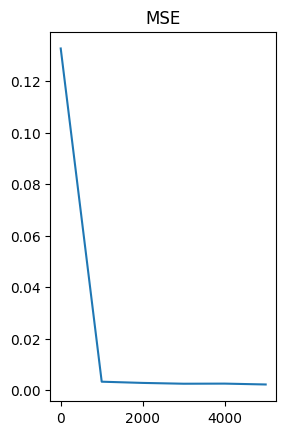

6000 13.258146524429321 secs per 1000 iters psnr: tensor(26.9786, device='cuda:0', dtype=torch.float64)
mse:0.00200511422008276, psnrs:26.978609040197558


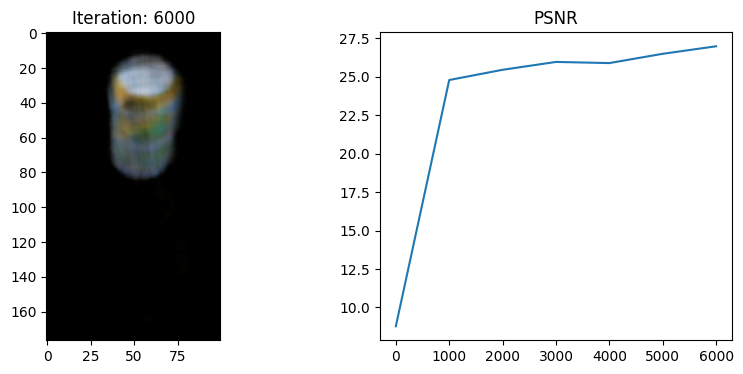

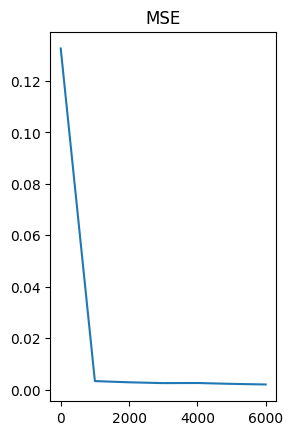

7000 13.863964080810547 secs per 1000 iters psnr: tensor(26.7946, device='cuda:0', dtype=torch.float64)
mse:0.0020918971858918667, psnrs:26.79459687262945


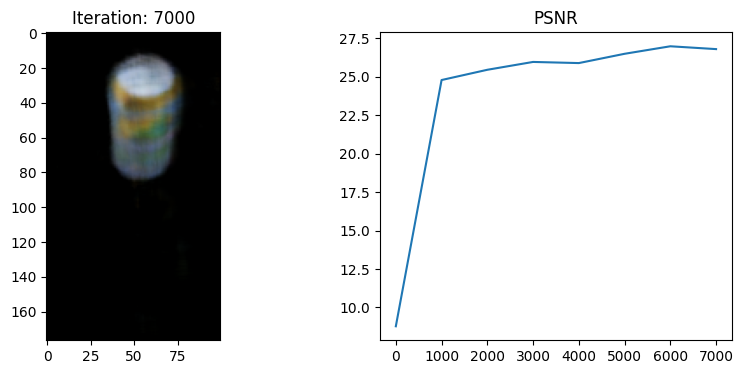

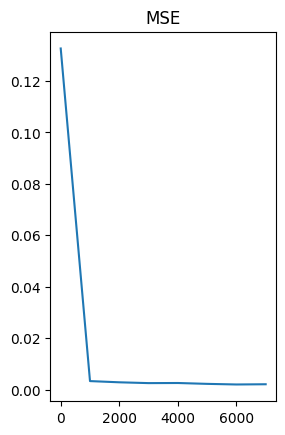

{'psnrs': [tensor(8.7724, dtype=torch.float64),
  tensor(24.7840, dtype=torch.float64),
  tensor(25.4504, dtype=torch.float64),
  tensor(25.9604, dtype=torch.float64),
  tensor(25.8864, dtype=torch.float64),
  tensor(26.4899, dtype=torch.float64),
  tensor(26.9786, dtype=torch.float64),
  tensor(26.7946, dtype=torch.float64)],
 'mses': [tensor(0.1327),
  tensor(0.0033),
  tensor(0.0029),
  tensor(0.0025),
  tensor(0.0026),
  tensor(0.0022),
  tensor(0.0020),
  tensor(0.0021)],
 'num_iter': [0, 1000, 2000, 3000, 4000, 5000, 6000, 7000]}

In [ ]:
import torch.optim as optim
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
learning_rate = 5e-4
iters = 8000
criterion = nn.MSELoss()

num_frequency_bands = 8

input_dim = None
## compute the input_dim
input_dim = 3 * (1 + 2 * num_frequency_bands)

model = SimpleNeRFMLP(input_dim, 256, 4).to(device)
baseline = SimpleNeRFMLP(input_dim, 128, 2).to(device)

optimizer = optim.Adam(model.parameters(), lr=learning_rate)

train_nerf_model(model, optimizer, criterion, iters, training_data, train_images, H, W, focal, train_poses, device,
    num_freq_bands=num_frequency_bands, batch_size=1024, near=2., far=6., N_samples=64)

# 5. Render Results

In [ ]:
# cite: https://keras.io/examples/vision/nerf/

def trans_t(t):
    return np.array([
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 1, t],
        [0, 0, 0, 1]
    ])

def rot_phi(phi):
    return np.array([
        [1, 0, 0, 0],
        [0, np.cos(phi), -np.sin(phi), 0],
        [0, np.sin(phi), np.cos(phi), 0],
        [0, 0, 0, 1]
    ])

def rot_theta(th):
    return np.array([
        [np.cos(th), 0, -np.sin(th), 0],
        [0, 1, 0, 0],
        [np.sin(th), 0, np.cos(th), 0],
        [0, 0, 0, 1]
    ])

def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius)
    c2w = rot_phi(phi / 180. * np.pi) @ c2w
    c2w = rot_theta(theta / 180. * np.pi) @ c2w
    c2w = np.array([[-1, 0, 0, 0],
                    [0, 0, 1, 0],
                    [0, 1, 0, 0],
                    [0, 0, 0, 1]]) @ c2w
    return c2w


In [ ]:
# cite: https://keras.io/examples/vision/nerf/

def renderer(model, poses):
    with torch.no_grad():
        rgbs, depths = [], []
        for v in trange(len(poses)):
            # Render the holdout view for logging
            # use global vaiables here
            rays = get_rays(H, W, focal, poses[v])
            rays = torch.tensor(rays).reshape(2, -1, 3)
            # use chunk trick to overcome GPU OOM issue.
            num_chunks = 5
            ray_chunks = torch.chunk(rays, num_chunks, dim=1)

            for k in range(5):
                chunk = ray_chunks[k].to(device)
                rgb_chunk, depth_chunk, acc_chunk \
                    = render_rays(
                        model, 8, chunk, 2., 6.,
                        64, rand=False)
                rgb_chunk = rgb_chunk.detach().cpu()
                depth_chunk = depth_chunk.detach().cpu()
                acc_chunk = acc_chunk.detach().cpu()
                # Merge the results from each chunk back together
                if k == 0:
                    rgb = rgb_chunk
                    depth = depth_chunk
                    acc = acc_chunk
                else:
                    rgb = torch.cat((rgb, rgb_chunk), dim=0)
                    depth = torch.cat((depth, depth_chunk), dim=0)
                    acc = torch.cat((acc, acc_chunk), dim=0)
            image_h = train_images.shape[1]
            image_w = train_images.shape[2]
            rgb = rgb.reshape(image_h, image_w, 3)
            depth = depth.reshape(image_h, image_w, 1)
            rgbs.append(rgb)
            depths.append(depth)
        return rgbs, depths

In [ ]:
# cite: https://keras.io/examples/vision/nerf/

num_render_poses = 100
render_poses = np.stack([pose_spherical(angle, -30.0, 4.0) for angle in np.linspace(-180,180,num_render_poses+1)[:-1]], 0)
rgbs, depths = renderer(model, render_poses)
to8b = lambda x : (255*np.clip(x,0,1)).astype(np.uint8)

# Define the output video file path
imageio.mimwrite('2k_video.mp4', to8b(np.stack(rgbs)), fps=10, quality=8)


mp4 = open('2k_video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=300 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

100%|██████████| 100/100 [00:11<00:00,  8.64it/s]


# 6. Whatever